<a href="https://colab.research.google.com/github/MPcooray/Grayscale-conversion/blob/main/Grayscale_Conversion_CUDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Added Github Repo**
---
It includes -
*  OpenMP code
*  Seriel Code
*  MPI Code
*  Photo jpg






In [ ]:
!git clone https://github.com/MPcooray/Grayscale-conversion.git

Cloning into 'Grayscale-conversion'...
remote: Enumerating objects: 13, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 13 (delta 0), reused 13 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (13/13), 41.02 MiB | 14.41 MiB/s, done.


**Prepares the Google Colab environment for running CUDA code.**
---



In [ ]:
# run in a code cell
!pip install -q pillow
!nvcc --version || echo "nvcc not found (usually present in Colab)"
!nvidia-smi


nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
Thu Nov 27 17:45:10 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8       

**Allows the user to upload a sample image for testing the CUDA grayscale conversion pipeline.**

In [ ]:
from google.colab import files
print("Upload your photo (e.g. myphoto.jpg) — choose from the dialog.")
uploaded = files.upload()
print("Uploaded:", list(uploaded.keys()))


Upload your photo (e.g. myphoto.jpg) — choose from the dialog.


Saving myphoto.jpg to myphoto.jpg
Uploaded: ['myphoto.jpg']


**Converting the uploaded image into a PPM file.**

In [ ]:
from PIL import Image
import os


imgs = list(uploaded.keys())
if not imgs:
    raise SystemExit("No image uploaded: run the upload cell.")
src = imgs[0]
print("Converting", src, "to PPM...")
im = Image.open(src).convert("RGB")
ppm_name = os.path.splitext(src)[0] + ".ppm"
im.save(ppm_name, format="PPM")
print("Saved", ppm_name)


Converting myphoto.jpg to PPM...
Saved myphoto.ppm


**CUDA Code**

In [27]:
%%bash
cat > grayscale_cuda.cu << 'EOF'
// grayscale_cuda.cu
// Simple student-style CUDA program to convert P6 PPM -> P5 PGM (RGB -> grayscale).
// Idea: rank-0 host reads image, copy RGB to device, launch kernel (one thread per pixel),
// copy gray back and write PGM. This follows lecture ideas: host-device transfer + kernel parallelism.

#include <stdio.h>
#include <stdlib.h>
#include <cuda_runtime.h>

static inline void checkCuda(cudaError_t e, const char *msg) {
    if (e != cudaSuccess) {
        fprintf(stderr, "CUDA error %s: %s\n", msg, cudaGetErrorString(e));
        exit(1);
    }
}

/* Read simple binary P6 PPM (assumes well-formed P6 without comments).
   Returns malloc'd RGB buffer (3*w*h bytes) and sets *w and *h, or NULL on error. */
unsigned char *read_ppm(const char *fname, int *w, int *h) {
    FILE *f = fopen(fname, "rb");
    if (!f) { perror("fopen"); return NULL; }
    char magic[3] = {0};
    if (fscanf(f, "%2s", magic) != 1) { fclose(f); return NULL; }
    if (magic[0] != 'P' || magic[1] != '6') { fprintf(stderr,"Not P6\n"); fclose(f); return NULL; }
    int width=0, height=0, maxv=0;
    if (fscanf(f, "%d %d %d", &width, &height, &maxv) != 3) { fclose(f); return NULL; }
    fgetc(f); // skip single whitespace
    size_t n = (size_t)width * height * 3;
    unsigned char *buf = (unsigned char*)malloc(n);
    if (!buf) { fclose(f); return NULL; }
    size_t got = fread(buf, 1, n, f);
    fclose(f);
    if (got != n) { free(buf); return NULL; }
    *w = width; *h = height;
    return buf;
}

/* Write simple binary P5 PGM (gray, one byte per pixel) */
int write_pgm(const char *fname, unsigned char *g, int w, int h) {
    FILE *f = fopen(fname, "wb");
    if (!f) { perror("fopen"); return -1; }
    if (fprintf(f, "P5\n%d %d\n255\n", w, h) < 0) { fclose(f); return -1; }
    size_t wrote = fwrite(g, 1, (size_t)w * h, f);
    fclose(f);
    return (wrote == (size_t)w * h) ? 0 : -1;
}

/* CUDA kernel: each thread computes one grayscale pixel */
__global__ void rgb2gray_kernel(const unsigned char *rgb, unsigned char *gray, int w, int h) {
    int x = blockIdx.x * blockDim.x + threadIdx.x;
    int y = blockIdx.y * blockDim.y + threadIdx.y;
    if (x >= w || y >= h) return;
    int idx = y * w + x;
    int r3 = idx * 3;
    unsigned char r = rgb[r3];
    unsigned char g = rgb[r3 + 1];
    unsigned char b = rgb[r3 + 2];
    float L = 0.21f * r + 0.72f * g + 0.07f * b;
    int v = (int)(L + 0.5f);
    if (v < 0) v = 0;
    if (v > 255) v = 255;
    gray[idx] = (unsigned char)v;
}

int main(int argc, char **argv) {
    if (argc != 3) { fprintf(stderr, "Usage: %s input.ppm output.pgm\n", argv[0]); return 1; }

    int w=0, h=0;
    unsigned char *h_rgb = read_ppm(argv[1], &w, &h);
    if (!h_rgb) { fprintf(stderr, "Failed to read %s\n", argv[1]); return 2; }

    size_t rgb_bytes = (size_t)w * h * 3;
    size_t gray_bytes = (size_t)w * h;

    unsigned char *h_gray = (unsigned char*)malloc(gray_bytes);
    if (!h_gray) { fprintf(stderr, "malloc failed\n"); free(h_rgb); return 3; }

    unsigned char *d_rgb = NULL, *d_gray = NULL;
    checkCuda(cudaMalloc((void**)&d_rgb, rgb_bytes), "cudaMalloc d_rgb");
    checkCuda(cudaMalloc((void**)&d_gray, gray_bytes), "cudaMalloc d_gray");

    // Host -> Device
    checkCuda(cudaMemcpy(d_rgb, h_rgb, rgb_bytes, cudaMemcpyHostToDevice), "H2D memcpy");

    // Launch kernel: one thread per pixel
    dim3 block(16,16);
    dim3 grid( (w + block.x - 1)/block.x, (h + block.y - 1)/block.y );
    rgb2gray_kernel<<<grid, block>>>(d_rgb, d_gray, w, h);
    checkCuda(cudaGetLastError(), "kernel launch");

    // Device -> Host
    checkCuda(cudaMemcpy(h_gray, d_gray, gray_bytes, cudaMemcpyDeviceToHost), "D2H memcpy");

    // Write output
    if (write_pgm(argv[2], h_gray, w, h) != 0) {
        fprintf(stderr, "Failed to write %s\n", argv[2]);
    } else {
        printf("Wrote %s (%dx%d)\n", argv[2], w, h);
    }

    cudaFree(d_rgb); cudaFree(d_gray);
    free(h_rgb); free(h_gray);
    return 0;
}


EOF


In [28]:
!nvcc -O3 -gencode=arch=compute_75,code=sm_75 grayscale_cuda.cu -o grayscale_cuda

In [29]:
!./grayscale_cuda myphoto.ppm myphoto_gray_cuda.pgm

Wrote myphoto_gray_cuda.pgm (5472x3648)


**Converting .ppm to .jpg image**

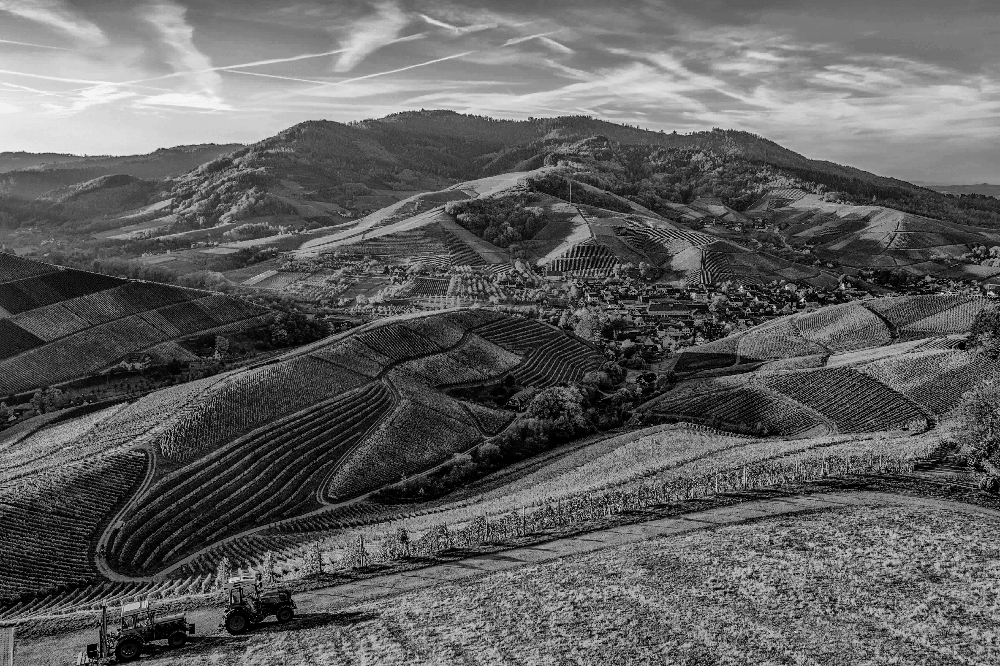

In [30]:
from PIL import Image
im = Image.open('myphoto_gray_cuda.pgm')
im.save('myphoto_gray_cuda.jpg')
display(im)   # shows inline
